# TP Tracking

In [ ]:
pip install opencv-python opencv-contrib-python numpy


In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
!wget -r -np -nH --cut-dirs=3 -P "/content/drive/My Drive/Videos/" https://helios2.mi.parisdescartes.fr/~lomn/Cours/CV/SeqVideo/Videos/
!wget -r -np -nH --cut-dirs=3 -P "/content/drive/My Drive/Videos/" https://helios2.mi.parisdescartes.fr/~lomn/Cours/CV/SeqVideo/Material/python/samples/


--2024-11-30 21:29:37--  https://helios2.mi.parisdescartes.fr/~lomn/Cours/CV/SeqVideo/Videos/
Resolving helios2.mi.parisdescartes.fr (helios2.mi.parisdescartes.fr)... 193.48.200.16
Connecting to helios2.mi.parisdescartes.fr (helios2.mi.parisdescartes.fr)|193.48.200.16|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3616 (3.5K) [text/html]
Saving to: ‘/content/drive/My Drive/Videos/SeqVideo/Videos/index.html’

SeqVideo/Videos/ind 100%[===================>]   3.53K  --.-KB/s    in 0s      

2024-11-30 21:29:38 (78.2 MB/s) - ‘/content/drive/My Drive/Videos/SeqVideo/Videos/index.html’ saved [3616/3616]

Loading robots.txt; please ignore errors.
--2024-11-30 21:29:38--  https://helios2.mi.parisdescartes.fr/robots.txt
Reusing existing connection to helios2.mi.parisdescartes.fr:443.
HTTP request sent, awaiting response... 404 Not Found
2024-11-30 21:29:38 ERROR 404: Not Found.

--2024-11-30 21:29:38--  https://helios2.mi.parisdescartes.fr/~lomn/Cours/CV/SeqVideo/Vide

# Flux Optique avec Lucas-Kanade

[https://docs.opencv.org/master/d4/dee/tutorial_optical_flow.html](https://docs.opencv.org/master/d4/dee/tutorial_optical_flow.html)

In [2]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow


In [ ]:
video_path = '/content/drive/MyDrive/Videos/SeqVideo/Material/python/samples/redcar.mp4'
#video_path = '/content/drive/MyDrive/Videos/SeqVideo/Videos/herisson.mp4'
cap = cv2.VideoCapture(video_path)


In [ ]:
#Prendre la première frame et détecter les coins à suivre
ret, old_frame = cap.read()
old_gray = cv2.cvtColor(old_frame, cv2.COLOR_BGR2GRAY)
#old_gray = cv2.GaussianBlur(old_gray, (5, 5), 0)
p0 = cv2.goodFeaturesToTrack(old_gray, maxCorners=100, qualityLevel=0.3, minDistance=7, blockSize=7)
#p0 = cv2.goodFeaturesToTrack(old_gray, maxCorners=200, qualityLevel=0.2, minDistance=5, blockSize=7) #Plus de coins détectés

#Masque pour dessiner les trajectoires
mask = np.zeros_like(old_frame)

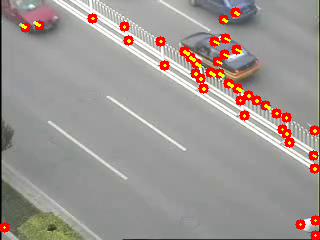

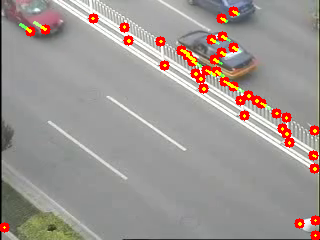

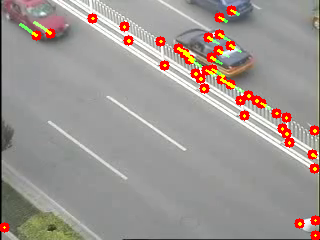

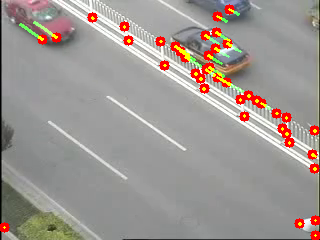

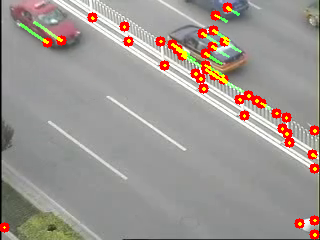

...

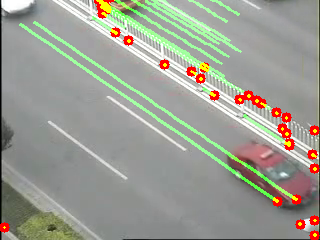

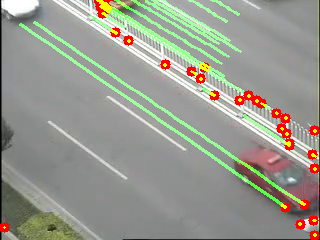

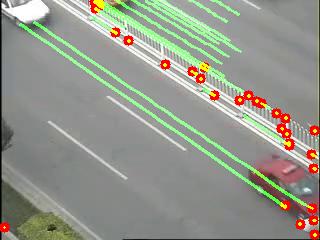

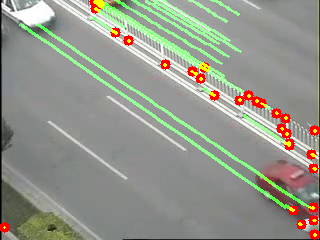

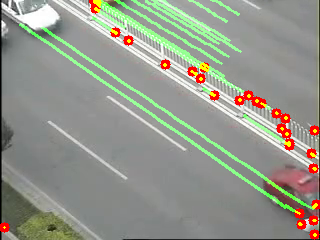

Traitement terminé.


In [ ]:
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    #frame_gray = cv2.GaussianBlur(frame_gray, (5, 5), 0)
    #Calculer le flux optique
    p1, st, err = cv2.calcOpticalFlowPyrLK(old_gray, frame_gray, p0, None, winSize=(15, 15), maxLevel=2,
                                           criteria=(cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))

    #Sélectionner les bons points
    good_new = p1[st == 1]
    good_old = p0[st == 1]

    #Dessiner les trajectoires
    for i, (new, old) in enumerate(zip(good_new, good_old)):
        a, b = new.ravel()
        c, d = old.ravel()
        mask = cv2.line(mask, (int(a), int(b)), (int(c), int(d)), (0, 255, 0), 2)  #Conversion en entiers
        frame = cv2.circle(frame, (int(a), int(b)), 5, (0, 0, 255), -1)  #Conversion en entiers

    img = cv2.add(frame, mask)

    #Afficher la frame
    cv2_imshow(img)

    #Mettre à jour pour la prochaine itération
    old_gray = frame_gray.copy()
    p0 = good_new.reshape(-1, 1, 2)

cap.release()
print("Traitement terminé.")


# Flux Optique Dense avec Farneback

In [3]:
video_path = '/content/drive/MyDrive/Videos/SeqVideo/Videos/homme.mp4'
#video_path = '/content/drive/MyDrive/Videos/SeqVideo/Material/python/samples/bio1.avi'

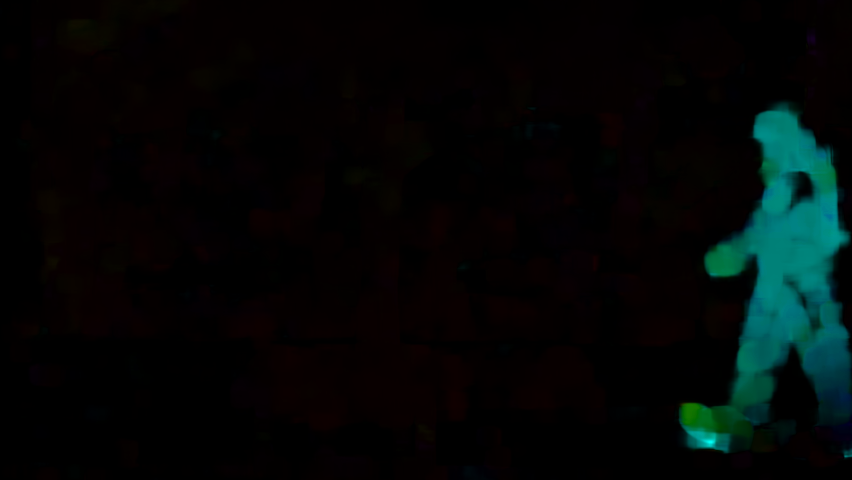

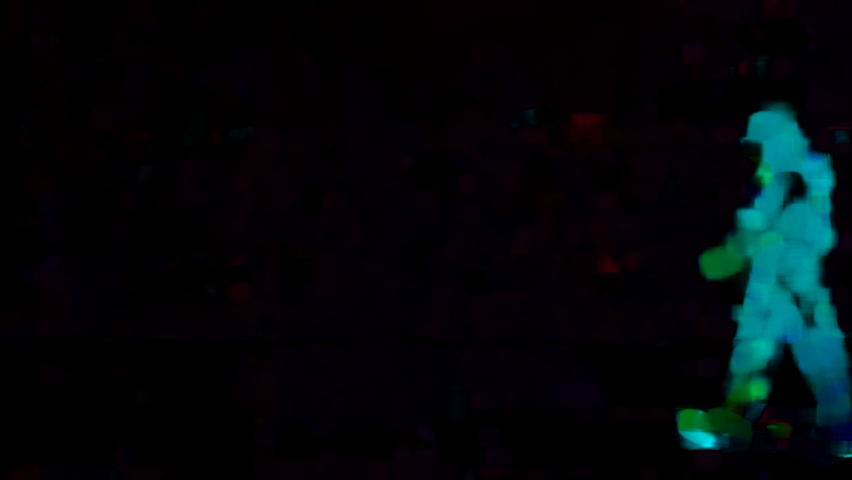

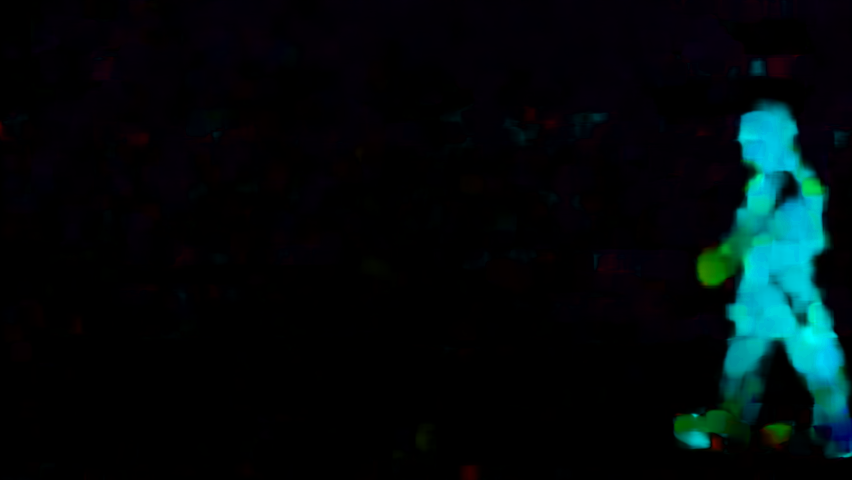

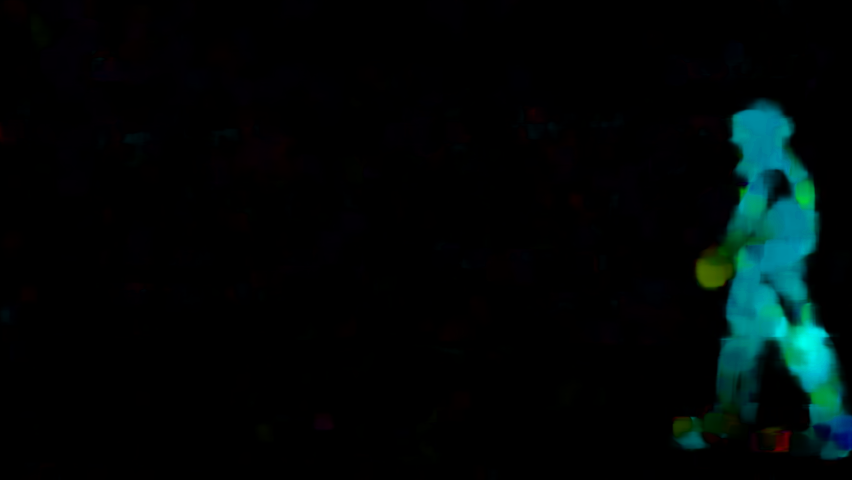

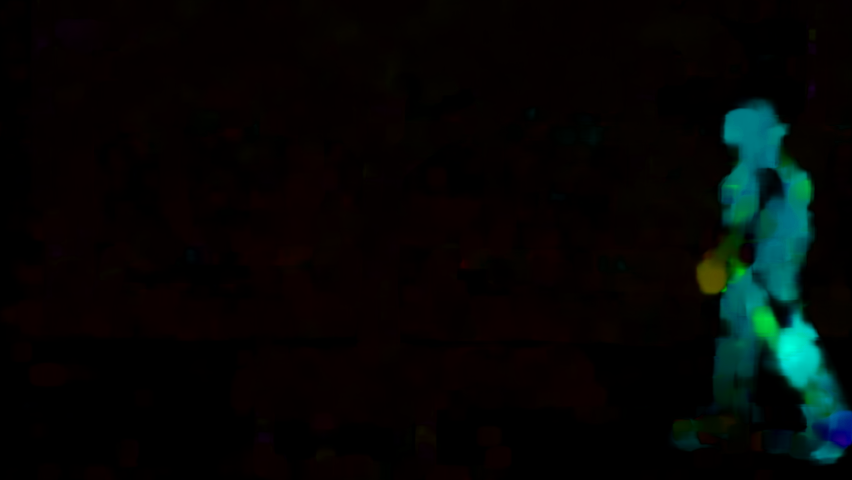

...

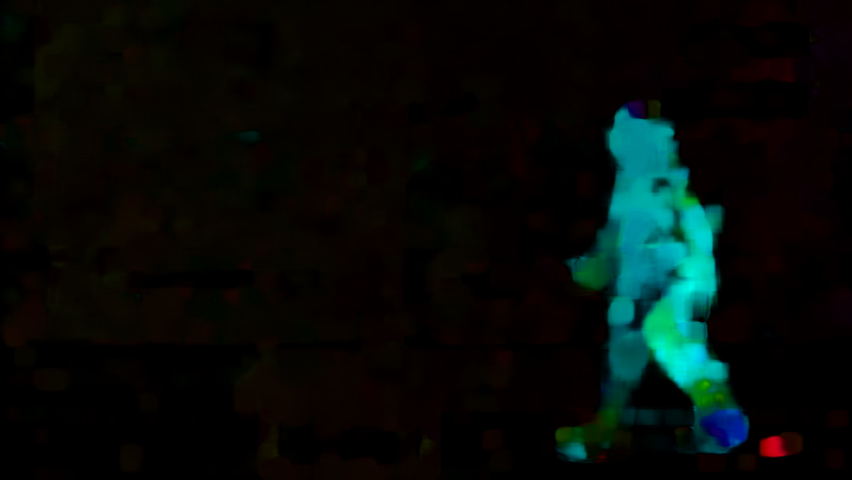

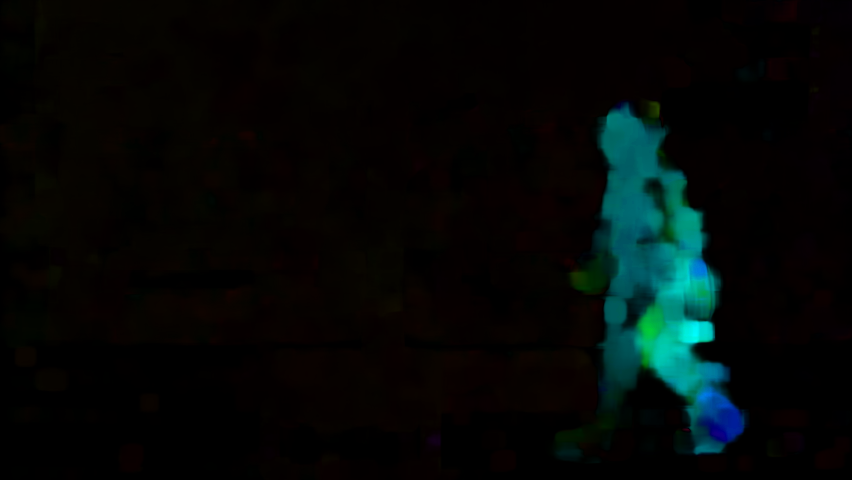

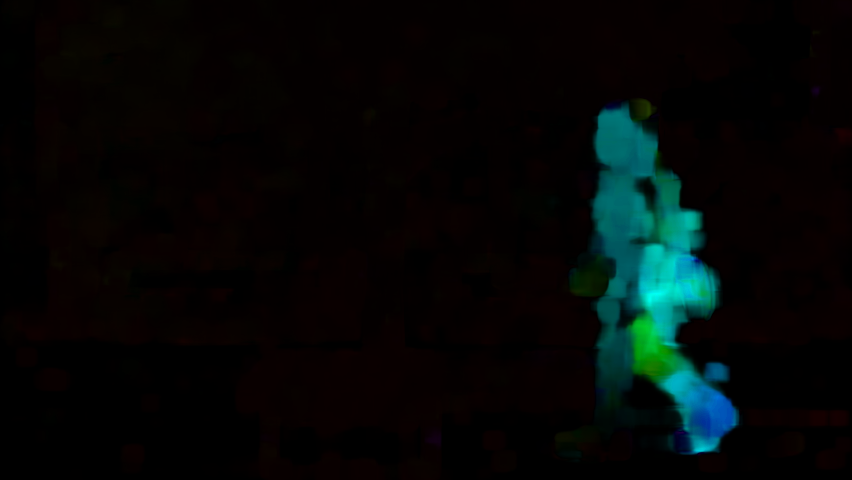

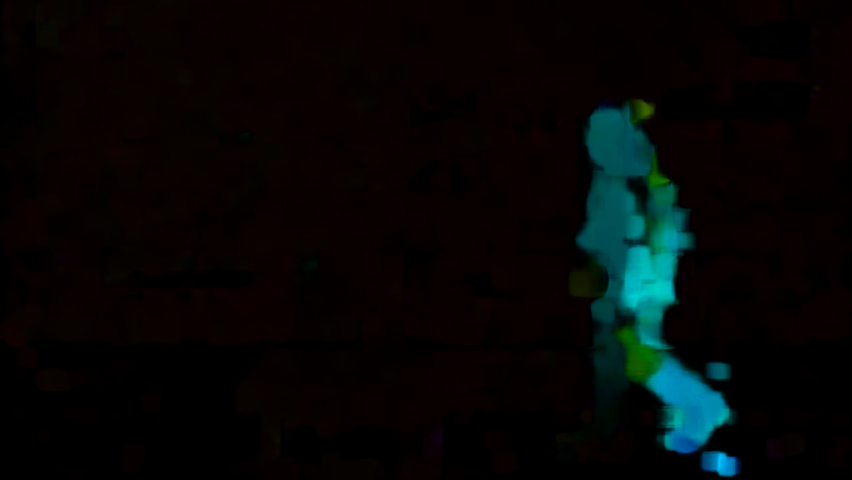

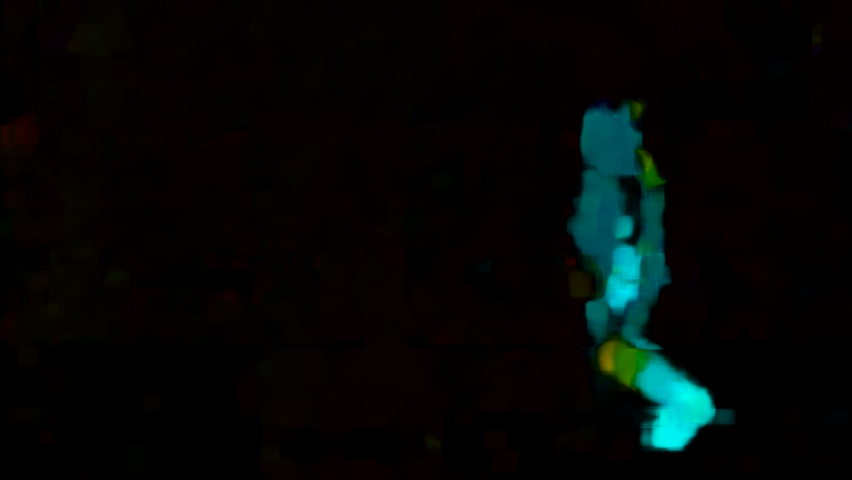

In [ ]:

cap = cv2.VideoCapture(video_path)

ret, frame1 = cap.read()
prvs = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)

#Obtenir les dimensions et le FPS de la vidéo d'entrée
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))

#Initialiser l'écrivain vidéo pour sauvegarder les résultats
output_path = '/content/drive/MyDrive/Videos/results/flux_optique_dense_output.mp4'
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Codec vidéo
out = cv2.VideoWriter(output_path, fourcc, fps, (frame_width, frame_height))

while cap.isOpened():
    ret, frame2 = cap.read()
    if not ret:
        print("Fin de la vidéo.")
        break

    next = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)

    #Calculer le flux optique dense
    flow = cv2.calcOpticalFlowFarneback(prvs, next, None, 0.5, 3, 15, 3, 5, 1.2, 0)

    #Visualiser
    mag, ang = cv2.cartToPolar(flow[..., 0], flow[..., 1])
    hsv = np.zeros_like(frame1)
    hsv[..., 0] = ang * 180 / np.pi / 2  #Teinte
    hsv[..., 1] = 255  #Saturation
    hsv[..., 2] = cv2.normalize(mag, None, 0, 255, cv2.NORM_MINMAX)  #Valeur

    #Convertir HSV en BGR pour affichage et enregistrement
    bgr = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
    cv2_imshow(bgr)

    #Enregistrer le frame dans la vidéo de sortie
    out.write(bgr)

    #Mettre à jour la frame précédente
    prvs = next

cap.release()
out.release()
print(f"Traitement terminé. Vidéo enregistrée sous : {output_path}")
